### human activity recognition using smartphones dataset

### By Athena Sheydaei

### Libraries

In [29]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest,f_classif
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, KFold
import numpy as np
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

# import data set

In [2]:
data=pd.read_csv("C:/Users/Lenovo/Desktop/Daneshgah_elmos/pattern/archive (2)/train.csv")
data_test=pd.read_csv("C:/Users/Lenovo/Desktop/Daneshgah_elmos/pattern/archive (2)/test.csv")
#data.columns[[2,3]]

In [3]:
data.head()
data.tail()
data.shape
data['Activity'].value_counts()

Activity
LAYING                1407
STANDING              1374
SITTING               1286
WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
Name: count, dtype: int64

### Data Duplicated

In [4]:
data.duplicated().any() #for cases

False

In [5]:
duplicated_columns=data.columns[data.T.duplicated()]
data.drop(duplicated_columns,axis=1,inplace=True)
data

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,1,STANDING
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,1,STANDING
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,1,STANDING
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,1,STANDING
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,1,STANDING
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.299665,-0.057193,-0.181233,-0.195387,0.039905,0.077078,-0.282301,0.043616,0.060410,0.210795,...,-0.880324,-0.190437,0.829718,0.206972,-0.425619,-0.791883,0.238604,0.049819,30,WALKING_UPSTAIRS
7348,0.273853,-0.007749,-0.147468,-0.235309,0.004816,0.059280,-0.322552,-0.029456,0.080585,0.117440,...,-0.680744,0.064907,0.875679,-0.879033,0.400219,-0.771840,0.252676,0.050053,30,WALKING_UPSTAIRS
7349,0.273387,-0.017011,-0.045022,-0.218218,-0.103822,0.274533,-0.304515,-0.098913,0.332584,0.043999,...,-0.304029,0.052806,-0.266724,0.864404,0.701169,-0.779133,0.249145,0.040811,30,WALKING_UPSTAIRS
7350,0.289654,-0.018843,-0.158281,-0.219139,-0.111412,0.268893,-0.310487,-0.068200,0.319473,0.101702,...,-0.344314,-0.101360,0.700740,0.936674,-0.589479,-0.785181,0.246432,0.025339,30,WALKING_UPSTAIRS


### Encoding

In [6]:
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(data["Activity"])
data["Activity"]=encoded_labels
original_to_encoded_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))


for label, encoded_label in original_to_encoded_mapping.items():
    print(f"Original Label: {label} - Encoded Label: {encoded_label}")


Original Label: LAYING - Encoded Label: 0
Original Label: SITTING - Encoded Label: 1
Original Label: STANDING - Encoded Label: 2
Original Label: WALKING - Encoded Label: 3
Original Label: WALKING_DOWNSTAIRS - Encoded Label: 4
Original Label: WALKING_UPSTAIRS - Encoded Label: 5


### missing data handling

In [7]:
data.isnull().sum()

tBodyAcc-mean()-X       0
tBodyAcc-mean()-Y       0
tBodyAcc-mean()-Z       0
tBodyAcc-std()-X        0
tBodyAcc-std()-Y        0
                       ..
angle(X,gravityMean)    0
angle(Y,gravityMean)    0
angle(Z,gravityMean)    0
subject                 0
Activity                0
Length: 542, dtype: int64

### distribution _ evaluating balance state

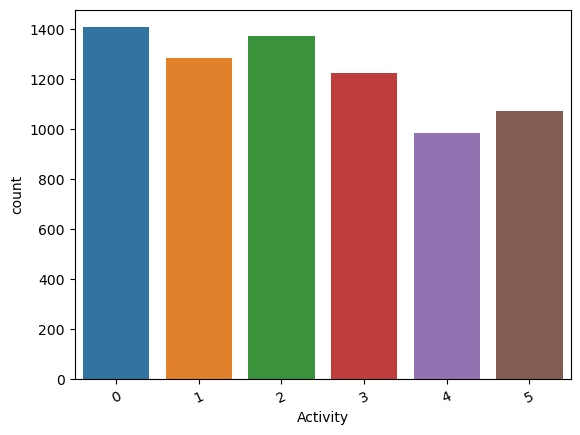

In [8]:
sns.countplot(data,x="Activity")
plt.xticks(rotation=25)
plt.show()

### handling outliers

In [38]:
isolation_forest = IsolationForest(contamination=0.05)
outlier_preds = isolation_forest.fit_predict(data)

data_without_outliers = data[outlier_preds == 1]  
data=data_without_outliers


### split target

In [12]:
x=data.drop(["Activity","subject"],axis=1)
y=data["Activity"]

### split dataset into train and test

In [13]:
kf = KFold(n_splits=10)
for train_index, test_index in kf.split(x):
    x_train, x_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

### Normalization

In [14]:
scaler=StandardScaler()
scaler.fit(x_train)
x_train=pd.DataFrame(scaler.transform(x_train),columns=x_train.columns)
x_test=pd.DataFrame(scaler.transform(x_test),columns=x_test.columns)

## Feature selection

### Filter Method

In [15]:
k=200
selector=SelectKBest(f_classif,k=k)
x_train_selected=selector.fit_transform(x_train,y_train)
x_test_selected=selector.transform(x_test)
selected_features=selector.get_support(indices=True)
new_features=x_train.columns[selected_features]
print(new_features)

Index(['tBodyAcc-std()-X', 'tBodyAcc-std()-Y', 'tBodyAcc-std()-Z',
       'tBodyAcc-mad()-X', 'tBodyAcc-mad()-Y', 'tBodyAcc-mad()-Z',
       'tBodyAcc-max()-X', 'tBodyAcc-max()-Y', 'tBodyAcc-max()-Z',
       'tBodyAcc-min()-X',
       ...
       'fBodyBodyGyroMag-mad()', 'fBodyBodyGyroMag-max()',
       'fBodyBodyGyroMag-iqr()', 'fBodyBodyGyroMag-entropy()',
       'fBodyBodyGyroJerkMag-mean()', 'fBodyBodyGyroJerkMag-mad()',
       'fBodyBodyGyroJerkMag-iqr()', 'fBodyBodyGyroJerkMag-entropy()',
       'angle(X,gravityMean)', 'angle(Y,gravityMean)'],
      dtype='object', length=200)


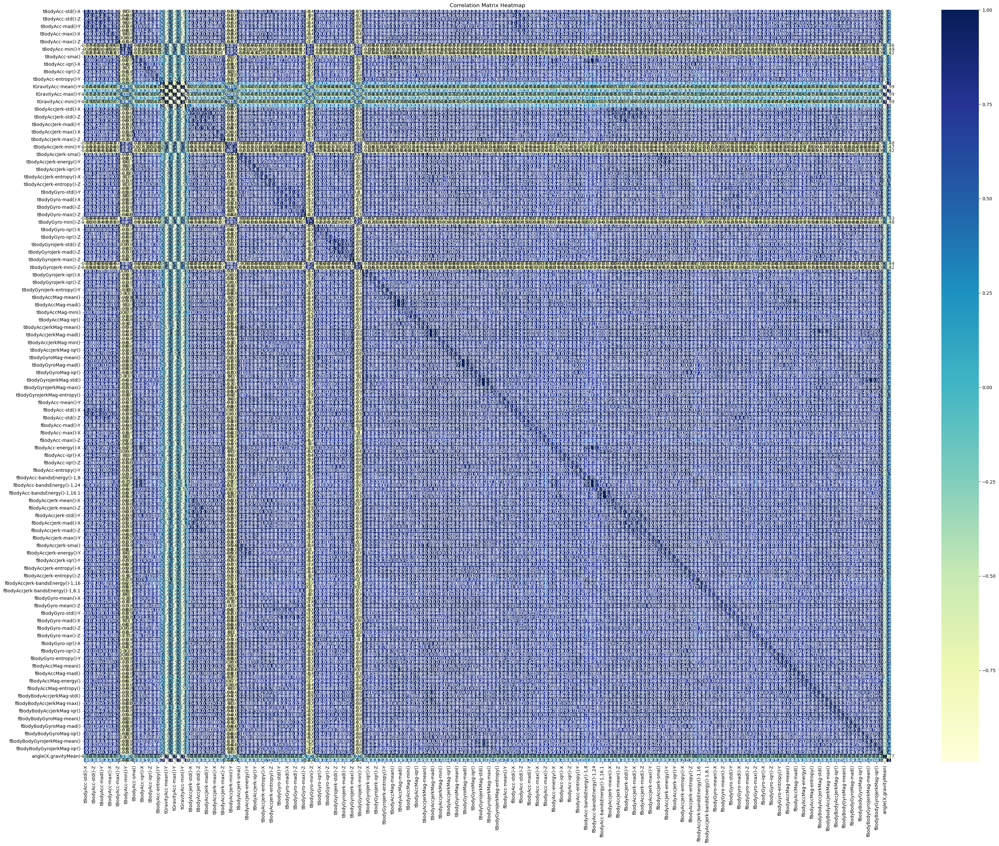

In [16]:
data_new=pd.DataFrame(x_train_selected,columns=new_features)
correlation_matrix=data_new.corr()

# Create a heatmap
plt.figure(figsize=(40, 30))
heatmap = sns.heatmap(correlation_matrix, annot=True, cmap="YlGnBu")
plt.title('Correlation Matrix Heatmap')
plt.show()

### Wrapper Method

In [17]:
estimator=RandomForestClassifier()

In [18]:
k=100
rfe_selector=RFE(estimator=estimator,n_features_to_select=k)
x_train_selected_rfe=rfe_selector.fit_transform(x_train_selected,y_train)
x_test_selected_rfe=rfe_selector.transform(x_test_selected)
selected_features_rfe=rfe_selector.get_support(indices=True)
print(selected_features_rfe)

[  0   3   6  13  17  19  20  21  22  23  24  25  26  27  28  30  31  32
  34  38  39  40  44  46  47  49  50  51  52  53  55  58  59  60  61  62
  63  64  65  66  67  69  70  72  77  78  79  81  84  85  86  89  90  91
 103 106 107 109 112 113 116 124 125 126 127 130 132 133 134 135 136 138
 139 140 142 143 144 151 152 153 155 156 157 158 159 160 161 162 165 166
 171 174 175 176 177 178 182 184 198 199]


## Modeling

### Random Forest

In [19]:
selected_feature_finally=selected_features[selected_features_rfe]
rf=RandomForestClassifier()
rf.fit(x_train_selected_rfe,y_train)
y_pred_rf=rf.predict(x_test_selected_rfe)


In [20]:
k = 10  # Number of folds
kf = KFold(n_splits=k, shuffle=True, random_state=42)
cv_scores = cross_val_score(rf,x_train_selected_rfe, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation scores
print("Cross-validation scores:", cv_scores)
print("Average cross-validation score:", np.mean(cv_scores))

Cross-validation scores: [0.97280967 0.98640483 0.97280967 0.97734139 0.97885196 0.97734139
 0.98791541 0.98184569 0.9924357  0.97276853]
Average cross-validation score: 0.9800524244598726


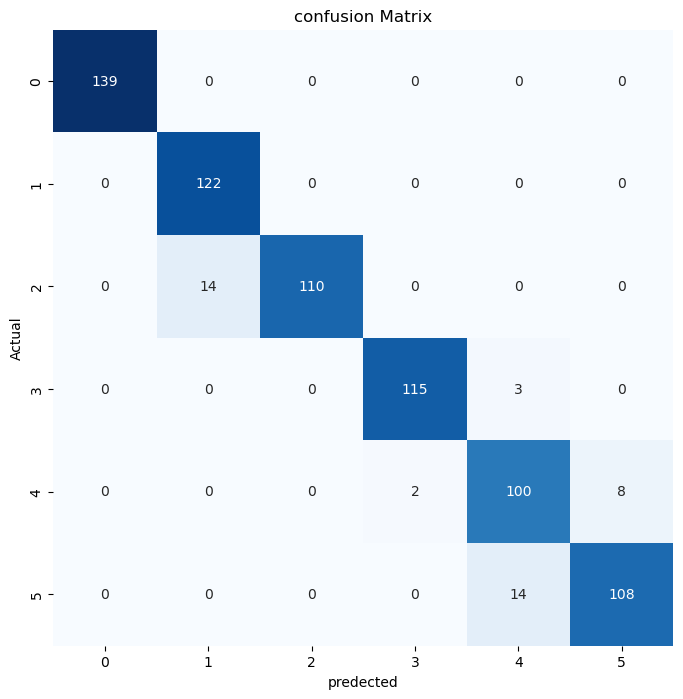

classification Report:
-------------------
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       139
           1       0.90      1.00      0.95       122
           2       1.00      0.89      0.94       124
           3       0.98      0.97      0.98       118
           4       0.85      0.91      0.88       110
           5       0.93      0.89      0.91       122

    accuracy                           0.94       735
   macro avg       0.94      0.94      0.94       735
weighted avg       0.95      0.94      0.94       735



In [21]:
cm=confusion_matrix(y_test,y_pred_rf)
clr=classification_report(y_test,y_pred_rf)
plt.figure(figsize=(8,8))
sns.heatmap(cm ,annot=True,fmt='g',vmin=0,cbar=False,cmap="Blues")
plt.xlabel("predected")
plt.ylabel("Actual")
plt.title("confusion Matrix")
plt.show()
print("classification Report:\n-------------------\n",clr)

### SVM

In [37]:
param_grid = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
}

svm_model = SVC()
grid_search = GridSearchCV(svm_model, param_grid, cv=5)
grid_search.fit(x_train_selected_rfe, y_train)
best_kernel = grid_search.best_params_['kernel']

print(best_kernel)

best_svm_model = SVC(kernel=best_kernel)
best_svm_model.fit(x_train_selected_rfe, y_train)

y_pred_svm = best_svm_model.predict(x_test_selected_rfe)

accuracy = accuracy_score(y_test, y_pred_svm)
print("Accuracy:", accuracy)

linear
Accuracy: 0.9741496598639455


### Evaluation

In [23]:
k = 10  
kf = KFold(n_splits=k, shuffle=True, random_state=42)
cv_scores = cross_val_score(svm_model,x_train_selected_rfe, y_train, cv=kf, scoring='accuracy')
print("Cross-validation scores:", cv_scores)
print("Average cross-validation score:", np.mean(cv_scores))

Cross-validation scores: [0.95317221 0.96676737 0.94864048 0.96827795 0.95468278 0.96827795
 0.97734139 0.96520424 0.96520424 0.96520424]
Average cross-validation score: 0.9632772828864077


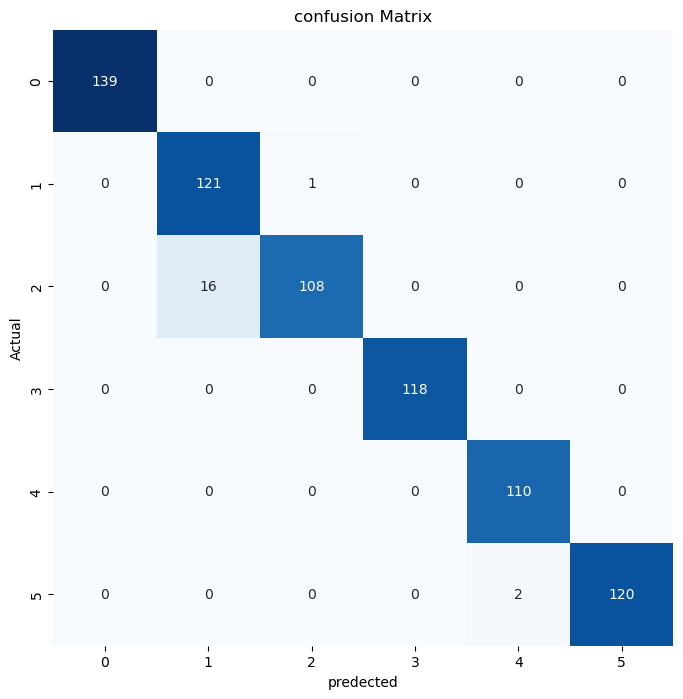

classification Report:
-------------------
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       139
           1       0.88      0.99      0.93       122
           2       0.99      0.87      0.93       124
           3       1.00      1.00      1.00       118
           4       0.98      1.00      0.99       110
           5       1.00      0.98      0.99       122

    accuracy                           0.97       735
   macro avg       0.98      0.97      0.97       735
weighted avg       0.98      0.97      0.97       735



In [24]:
cm=confusion_matrix(y_test,y_pred_svm)
clr=classification_report(y_test,y_pred_svm)
plt.figure(figsize=(8,8))
sns.heatmap(cm ,annot=True,fmt='g',vmin=0,cbar=False,cmap="Blues")
plt.xlabel("predected")
plt.ylabel("Actual")
plt.title("confusion Matrix")
plt.show()
print("classification Report:\n-------------------\n",clr)

### KNN

In [25]:
knn= KNeighborsClassifier() #shift+tab then you will see n_neighbors as a atribute as a difault
best_score = 0
best_k = 0
for k in range(1, 10):
    knn_model = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn_model, x_train_selected_rfe, y_train, cv=5)
    mean_score = np.mean(scores)
    if mean_score > best_score:
        best_score = mean_score
        best_k = k

    

print("Best value of k:",k)


Best value of k: 9


In [39]:
best_knn_model = KNeighborsClassifier(n_neighbors=best_k)
best_knn_model.fit(x_train_selected_rfe, y_train)


y_pred_knn = best_knn_model.predict(x_test_selected_rfe)


accuracy = np.mean(y_pred_knn == y_test)
print("Accuracy:", accuracy)

Accuracy: 0.963265306122449


### Evaluation

In [27]:
k = 10  # Number of folds
kf = KFold(n_splits=k, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_knn_model,x_train_selected_rfe, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation scores
print("Cross-validation scores:", cv_scores)
print("Average cross-validation score:", np.mean(cv_scores))

Cross-validation scores: [0.9652568  0.97734139 0.96676737 0.97583082 0.97280967 0.97129909
 0.98036254 0.96974281 0.98638427 0.97579425]
Average cross-validation score: 0.97415890050322


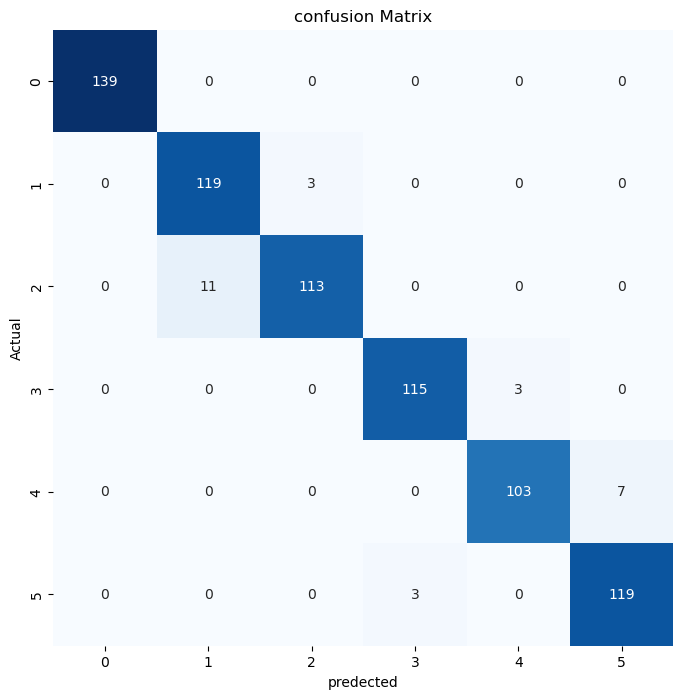

classification Report:
-------------------
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       139
           1       0.92      0.98      0.94       122
           2       0.97      0.91      0.94       124
           3       0.97      0.97      0.97       118
           4       0.97      0.94      0.95       110
           5       0.94      0.98      0.96       122

    accuracy                           0.96       735
   macro avg       0.96      0.96      0.96       735
weighted avg       0.96      0.96      0.96       735



In [28]:
cm=confusion_matrix(y_test,y_pred_knn)
clr=classification_report(y_test,y_pred_knn)
plt.figure(figsize=(8,8))
sns.heatmap(cm ,annot=True,fmt='g',vmin=0,cbar=False,cmap="Blues")
plt.xlabel("predected")
plt.ylabel("Actual")
plt.title("confusion Matrix")
plt.show()
print("classification Report:\n-------------------\n",clr)

### Gaussian Naive Bayes classifier

In [30]:
gnb = GaussianNB()
gnb.fit(x_train_selected_rfe, y_train)
y_pred_gnb = gnb.predict(x_test_selected_rfe)


accuracy = accuracy_score(y_test, y_pred_gnb)
print("Accuracy:", accuracy)

Accuracy: 0.8693877551020408


In [32]:
k = 10 
kf = KFold(n_splits=k, shuffle=True, random_state=42)
cv_scores = cross_val_score(gnb,x_train_selected_rfe, y_train, cv=kf, scoring='accuracy')

print("Cross-validation scores:", cv_scores)
print("Average cross-validation score:", np.mean(cv_scores))

Cross-validation scores: [0.84441088 0.87311178 0.85347432 0.86555891 0.85045317 0.86404834
 0.87613293 0.87443268 0.86838124 0.84871407]
Average cross-validation score: 0.861871832022341


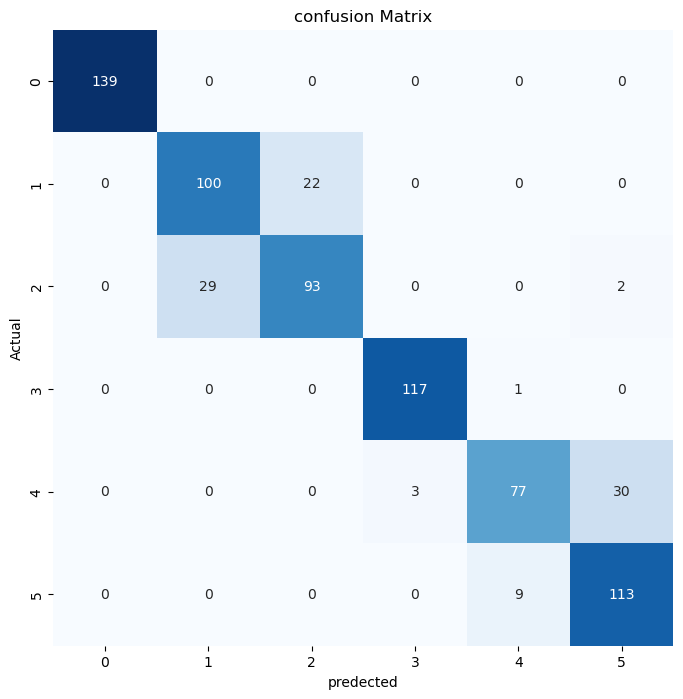

classification Report:
-------------------
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       139
           1       0.78      0.82      0.80       122
           2       0.81      0.75      0.78       124
           3       0.97      0.99      0.98       118
           4       0.89      0.70      0.78       110
           5       0.78      0.93      0.85       122

    accuracy                           0.87       735
   macro avg       0.87      0.86      0.86       735
weighted avg       0.87      0.87      0.87       735



In [33]:
cm=confusion_matrix(y_test,y_pred_gnb)
clr=classification_report(y_test,y_pred_gnb)
plt.figure(figsize=(8,8))
sns.heatmap(cm ,annot=True,fmt='g',vmin=0,cbar=False,cmap="Blues")
plt.xlabel("predected")
plt.ylabel("Actual")
plt.title("confusion Matrix")
plt.show()
print("classification Report:\n-------------------\n",clr)